<a href="https://colab.research.google.com/github/Trongnhat191/Traffic-Sign-Detection/blob/main/Traffic_Sign_Detection.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

#I. Traffic Sign Classification

In [1]:
cd /content/drive/MyDrive/Colab Notebooks/Traffic Sign Detection

/content/drive/MyDrive/Colab Notebooks/Traffic Sign Detection


In [2]:
import time
import os
import cv2
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import xml.etree.ElementTree as ET


In [3]:
from skimage.transform import resize
from skimage import feature
from sklearn.svm import SVC
from sklearn.preprocessing import LabelEncoder
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score

In [4]:
annotations_dir = 'annotations'
img_dir = 'images'

img_lst = []
label_lst = []

###Get sliced image and label

In [5]:
for xml_file in os.listdir(annotations_dir):
    xml_file_path = os.path.join(annotations_dir, xml_file)
    tree = ET.parse(xml_file_path)
    root = tree.getroot()

    folder = root.find('folder').text
    img_filename = root.find('filename').text
    img_filepath = os.path.join(img_dir, img_filename)
    img = cv2.imread(img_filepath)

    for obj in root.findall('object'):
        classname = obj.find('name').text
        if classname == 'trafficlight':
            continue

        x_min = int(obj.find('bndbox/xmin').text)
        y_min = int(obj.find('bndbox/ymin').text)
        x_max = int(obj.find('bndbox/xmax').text)
        y_max = int(obj.find('bndbox/ymax').text)

        object_img = img[y_min:y_max, x_min:x_max]
        img_lst.append(object_img)
        label_lst.append(classname)

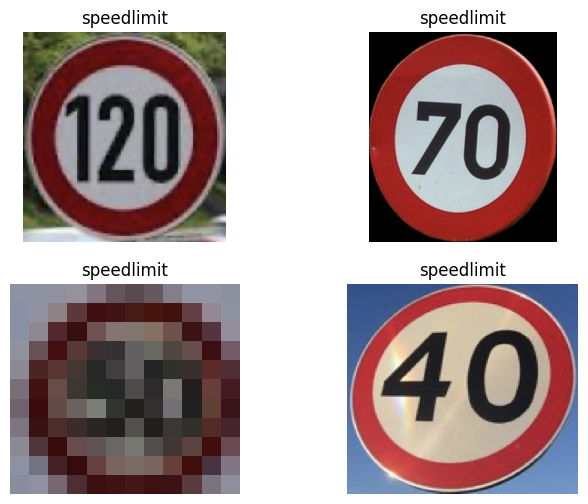

In [6]:
fig, ax = plt.subplots(2,2, figsize = (8,6))
for idx in range(2):
    for jdx in range(2):
        index= idx *4  +jdx
        plot_img = cv2.cvtColor(img_lst[index], cv2.COLOR_BGR2RGB)
        classname = label_lst[index]
        ax[idx, jdx].imshow(plot_img)
        ax[idx, jdx].set_title(classname)
        ax[idx, jdx].axis('off')
plt.show()

###Preprocess Image


In [7]:
def preprocess_img(img):
    if len(img.shape) > 2:
        img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    img = img.astype(np.float32)

    resized_img = resize(
        img,
        output_shape = (32,32),
        anti_aliasing = True
    )

    hog_feature = feature.hog(
        resized_img,
        orientations = 9,
        pixels_per_cell = (8,8),
        cells_per_block = (2,2),
        transform_sqrt = True,
        block_norm = 'L2',
        feature_vector = True
    )

    return hog_feature



In [8]:
img_features_lst = []
for img in img_lst:
    hog_feature = preprocess_img(img)
    img_features_lst.append(hog_feature)

img_features = np.array(img_features_lst)
print('X Shape:')
print(img_features.shape)

X Shape:
(1074, 324)


###Encode Label

In [9]:
label_encoder = LabelEncoder()
encoded_labels = label_encoder.fit_transform(label_lst)

In [10]:
label_encoder.classes_

array(['crosswalk', 'speedlimit', 'stop'], dtype='<U10')

###Create train, val set

In [11]:
random_state = 0
test_size = 0.3
is_shuffle = True

X_train, X_val, y_train, y_val = train_test_split(
    img_features, encoded_labels,
    test_size = test_size,
    random_state = random_state,
    shuffle = is_shuffle
)

###Normalization

In [12]:
scaler = StandardScaler()
X_train = scaler.fit_transform(X_train)
X_val = scaler.transform(X_val)

###Train and evaluate SVM Model

In [13]:
clf = SVC(
    kernel = 'rbf',
    random_state = random_state,
    probability = True,#de khi du doan co the in ra xac suat cua cac classes
    C = 0.5
)
clf.fit(X_train, y_train)

SVC(C=0.5, probability=True, random_state=0)

In [14]:
y_pred = clf.predict(X_val)
score = accuracy_score(y_val, y_pred)

print('Accuracy: ', score)

Accuracy:  0.9690402476780186


In [15]:
input_img = img_lst[1]
normalized_img = preprocess_img(input_img)
y_pred = clf.predict([normalized_img])[0]
print(f'Normal prediction: {label_lst[y_pred]}')
y_pred_prob = clf.predict_proba([normalized_img])
print(y_pred_prob)

Normal prediction: speedlimit
[[4.94695406e-09 9.99922972e-01 7.70232000e-05]]


#II. Traffic Sign Localization

In [16]:
# Hàm lấy danh sách toạ độ các cửa sổ
def sliding_window(img, window_sizes, stride, scale_factor):
#windows size: danh sach window size muon duyet
    img_height, img_width = img.shape[:2]
    windows = []
    for window_size in window_sizes:
        window_width, window_height = window_size
        for ymin in range(0, img_height - window_height + 1, stride):
            for xmin in range(0, img_width - window_width + 1, stride):
                xmax = xmin + window_width
                ymax = ymin + window_height

                windows.append([xmin, ymin, xmax, ymax])
    return windows

In [17]:
#Hàm lấy danh sách các ảnh pyramid
def pyramid(img, scale = 0.8, min_size = (30, 30)):
    acc_scale = 1.0
    pyramid_imgs = [(img, acc_scale)]

    i=0
    while True:
        acc_scale = acc_scale * scale
        h = int(img.shape[0] * acc_scale)
        w = int(img.shape[1] * acc_scale)
        if h<min_size[1] or w<min_size[0]:
            break
        img = cv2.resize(img, (w, h))
        pyramid_imgs.append((img, acc_scale * (scale ** i)))
        i+=1
    return pyramid_imgs

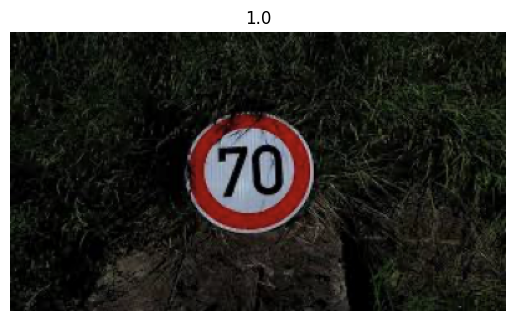

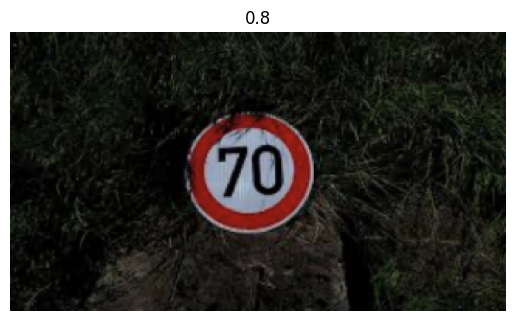

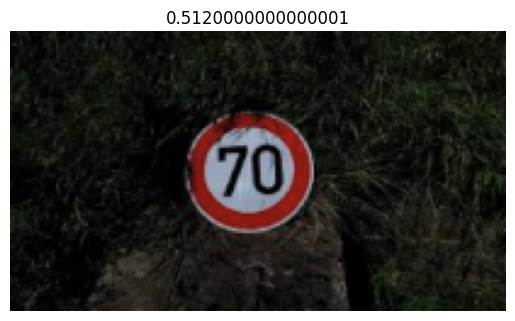

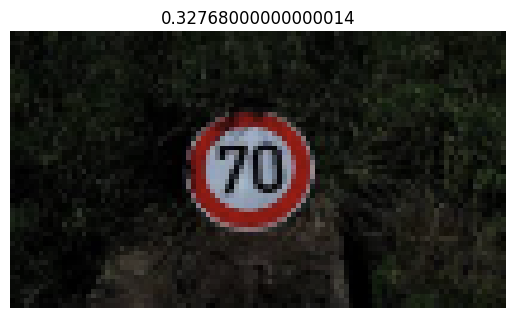

In [18]:
img_path = 'images/road115.png'
img = cv2.imread(img_path)
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
pyramid_imgs = pyramid(img)
for scale_img, acc_scale in pyramid_imgs:
    plt.imshow(scale_img)
    plt.title(acc_scale)
    plt.axis('off')
    plt.show()

In [19]:
def visualize_bbox(img, bboxes, label_encoder):
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    for box in bboxes:
        xmin, ymin, xmax, ymax , predict_id, conf_score = box

        cv2.rectangle(img, (xmin, ymin), (xmax, ymax), (0, 255, 0), 2)

        classname = label_encoder.inverse_transform([predict_id])[0]
        label = f'{classname}: {conf_score:.2f}'
        (w,h), _ = cv2.getTextSize(label, cv2.FONT_HERSHEY_SIMPLEX, 0.6, 1)

        cv2.rectangle(img, (xmin, ymin-20,), (xmin + w, ymin), (0, 255, 0), -1)

        cv2.putText(img, label, (xmin, ymin -5), cv2.FONT_HERSHEY_SIMPLEX, 0.6, (0,0,0), 1)
    plt.imshow(img)
    plt.axis('off')
    plt.show()

In [20]:
def compute_iou(bbox, bboxes, bbox_area, bboxes_area):
    xxmin = np.maximum(bbox[0], bboxes[:, 0])
    yymin = np.maximum(bbox[1], bboxes[:, 1])
    xxman = np.maximum(bbox[2], bboxes[:, 2])
    yyman = np.maximum(bbox[3], bboxes[:, 3])

    w = np.maximum(0, xxman - xxmin + 1)
    h = np.maximum(0, yyman - yymin + 1)

    intersection = w * h
    iou = intersection / (bbox_area + bboxes_area - intersection)
    return iou

In [21]:
def nms(bboxes, iou_threshold):
    if not bboxes:
        return []
    scores = np.array([box[5] for box in bboxes])
    sorted_indices = np.argsort(scores)[::-1]

    xmin = np.array([bbox[0] for bbox in bboxes])
    ymin = np.array([bbox[1] for bbox in bboxes])
    xmax = np.array([bbox[2] for bbox in bboxes])
    ymax = np.array([bbox[3] for bbox in bboxes])

    areas = (xmax - xmin + 1) * (ymax - ymin + 1)

    keep = []
    while sorted_indices.size > 0:
        i = sorted_indices[0]
        keep.append(i)

        iou = compute_iou(
            [xmin[i], ymin[i], xmax[i], ymax[i]],
            np.array(
                [
                    xmin[sorted_indices[1:]],
                    ymin[sorted_indices[1:]],
                    xmax[sorted_indices[1:]],
                    ymax[sorted_indices[1:]]]
            ).T,
            areas[i],
            areas[sorted_indices[1:]]
        )

        idx_to_keep = np.where(iou <= iou_threshold)[0]
        sorted_indices = sorted_indices[idx_to_keep + 1]

    return [bboxes[i] for i in keep]



######Inference Code

images/road184.png


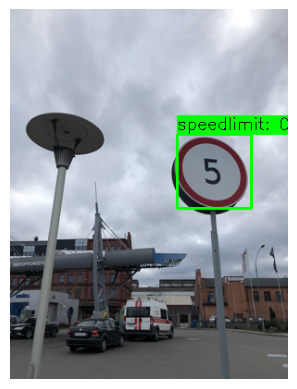

Time: 4.188251972198486
images/road129.png


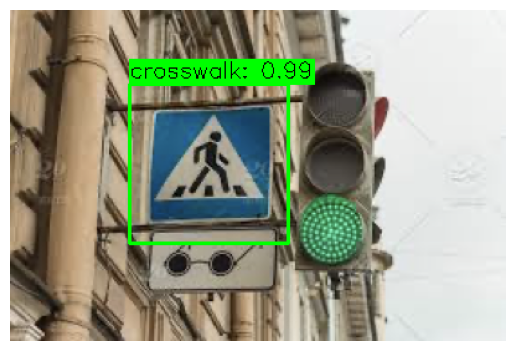

Time: 2.1778297424316406
images/road173.png


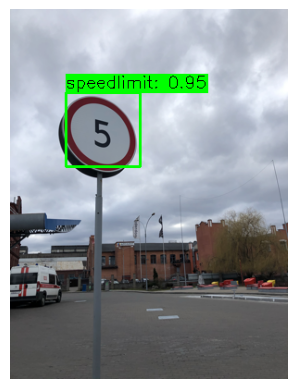

Time: 2.590115785598755
images/road150.png


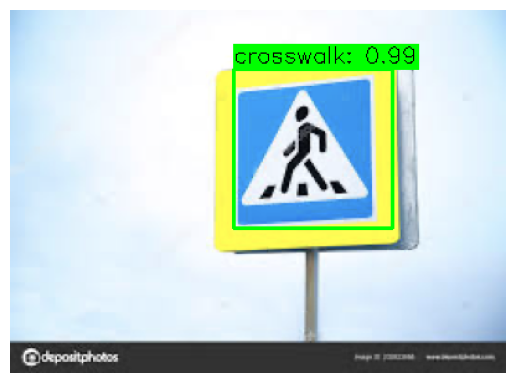

Time: 2.904689311981201
images/road131.png


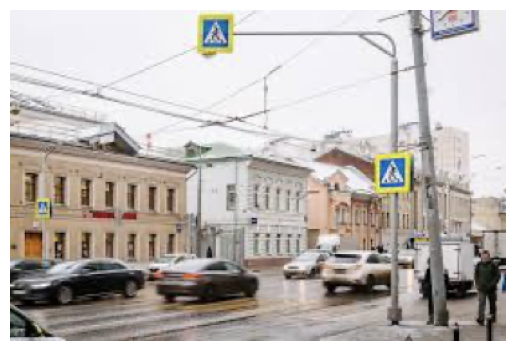

Time: 2.6251862049102783
images/road151.png


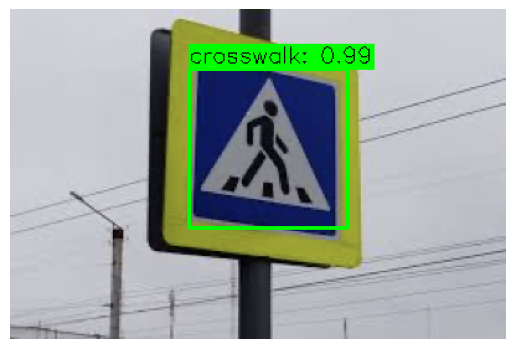

Time: 2.0866012573242188
images/road164.png


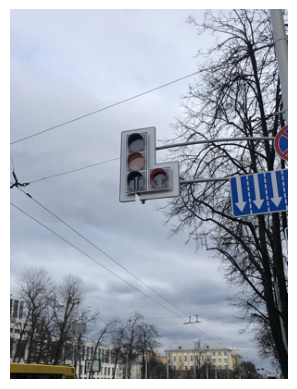

Time: 2.557488203048706
images/road136.png


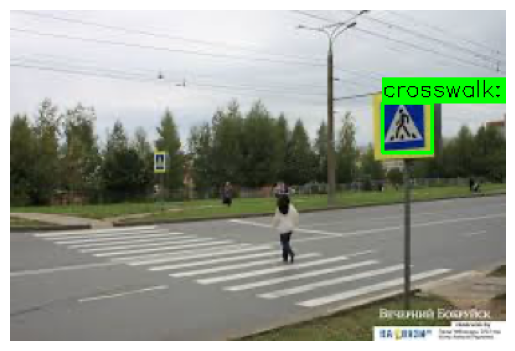

Time: 2.2816619873046875
images/road133.png


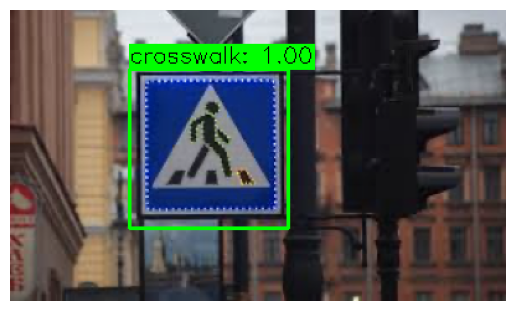

Time: 1.858910083770752
images/road169.png


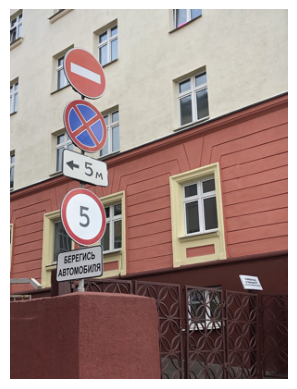

Time: 3.3094959259033203
images/road168.png


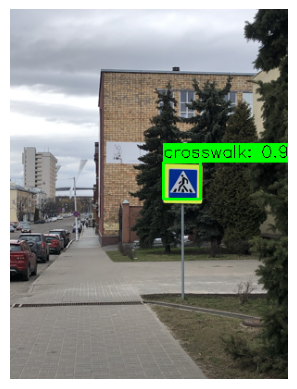

Time: 2.5632598400115967
images/road179.png


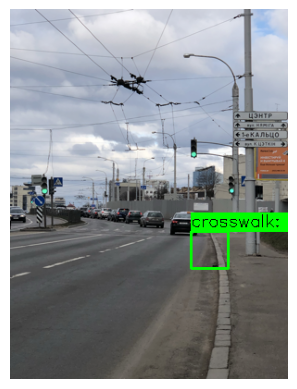

Time: 2.5748414993286133
images/road15.png


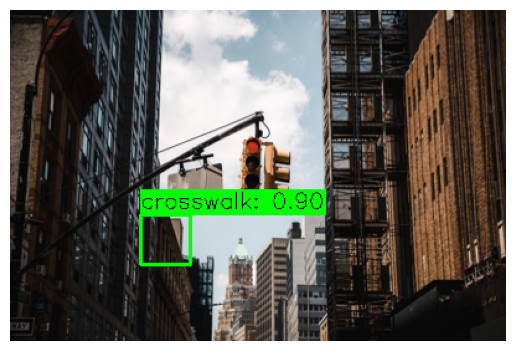

Time: 2.2151455879211426
images/road185.png


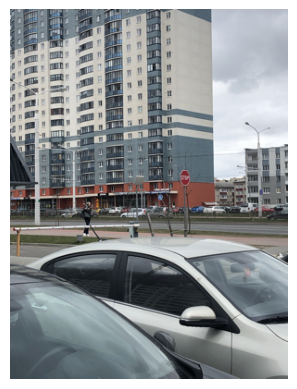

Time: 3.052860736846924
images/road192.png


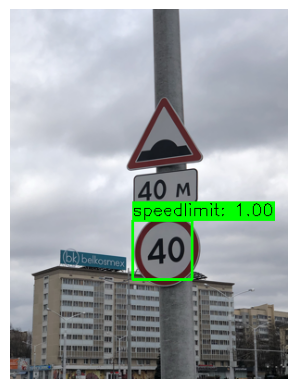

Time: 2.9798405170440674
images/road130.png


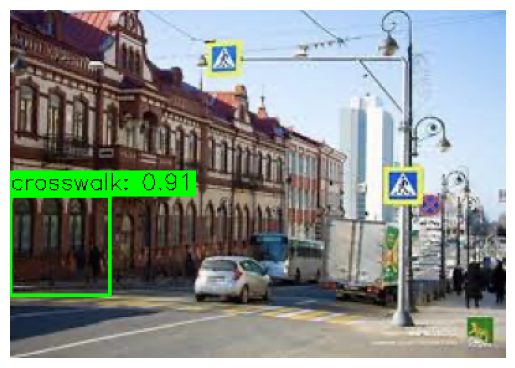

Time: 2.4533419609069824
images/road19.png


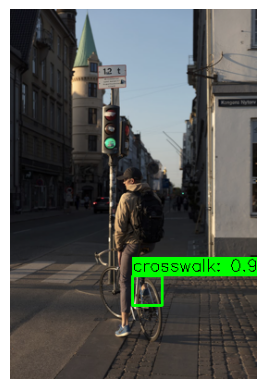

Time: 2.1491692066192627
images/road170.png


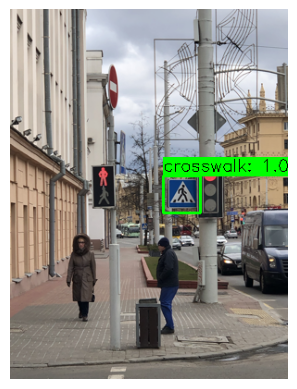

Time: 2.625943183898926
images/road132.png


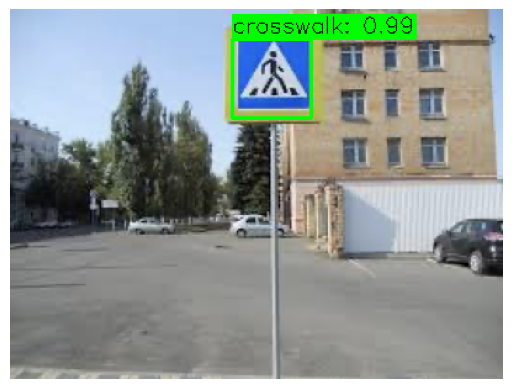

Time: 3.450566291809082
images/road172.png


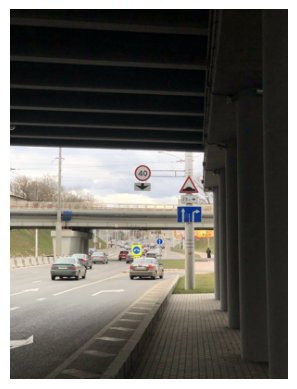

Time: 2.6698813438415527
images/road171.png


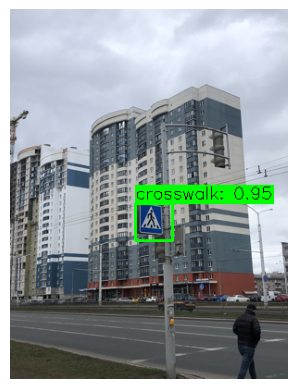

Time: 2.5654335021972656
images/road186.png


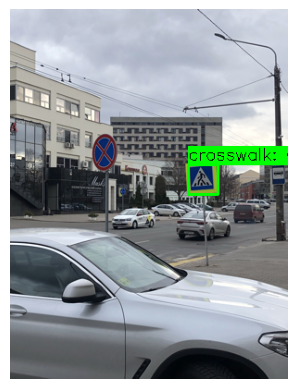

Time: 2.615086793899536
images/road139.png


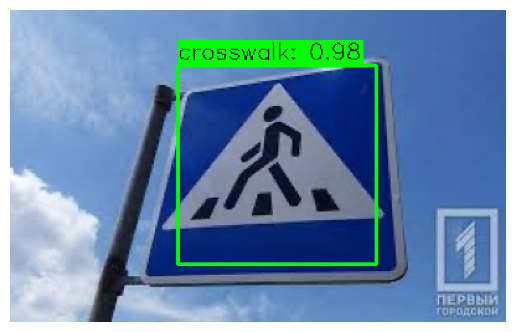

Time: 2.00346040725708
images/road153.png


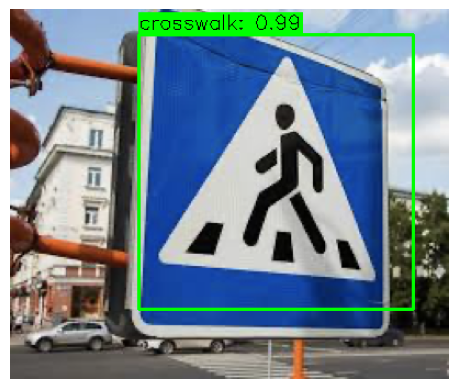

Time: 4.04261589050293
images/road135.png


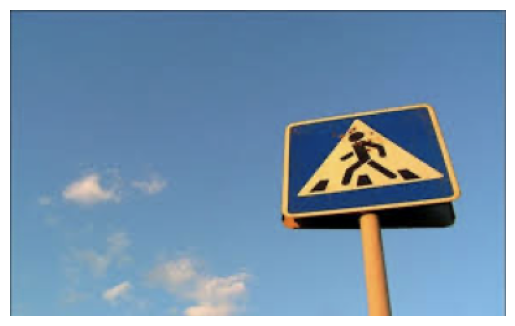

Time: 1.8463408946990967
images/road163.png


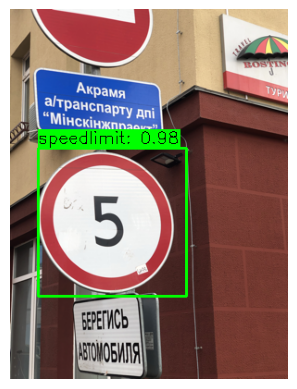

Time: 2.618805408477783
images/road18.png


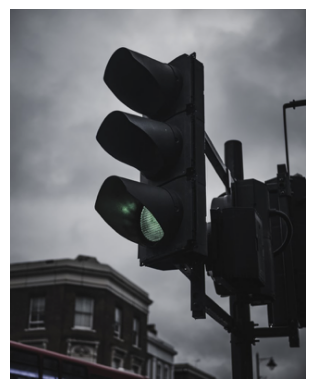

Time: 2.880596876144409
images/road138.png


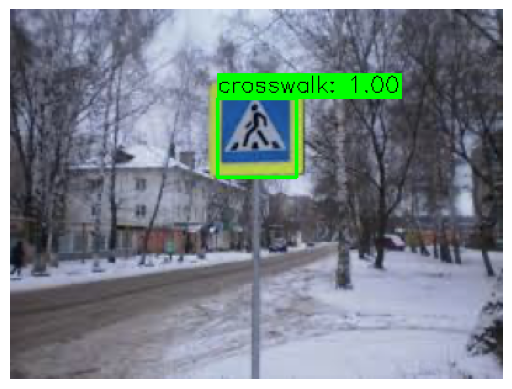

Time: 3.158582925796509
images/road144.png


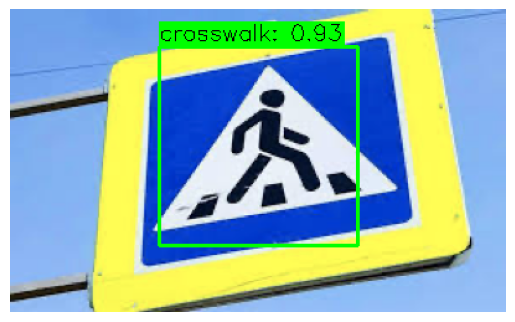

Time: 2.344531774520874
images/road17.png


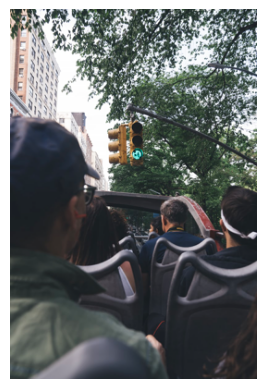

Time: 2.1714751720428467
images/road149.png


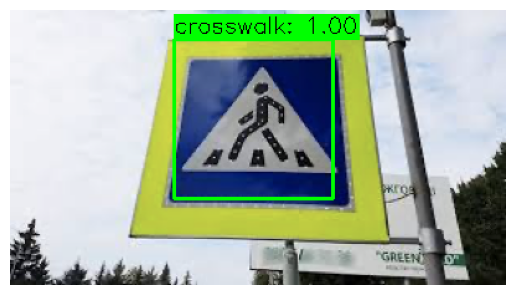

Time: 1.7045931816101074
images/road182.png


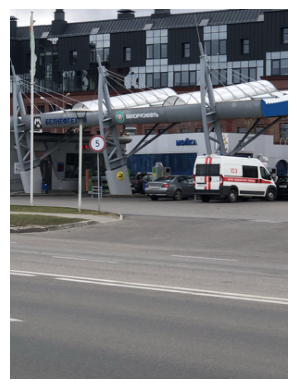

Time: 2.613285779953003
images/road143.png


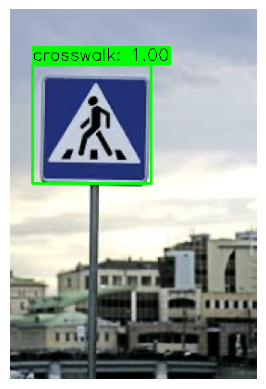

Time: 2.140669107437134
images/road176.png


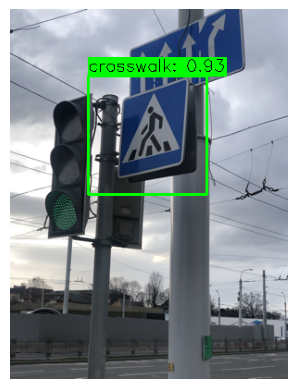

Time: 3.521663188934326
images/road154.png


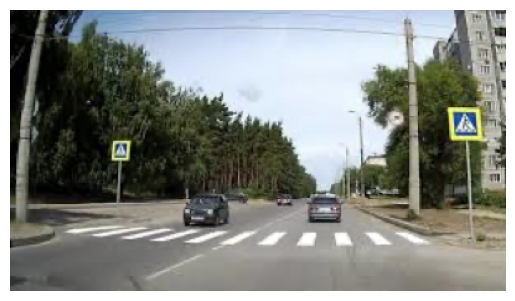

Time: 1.7733960151672363
images/road134.png


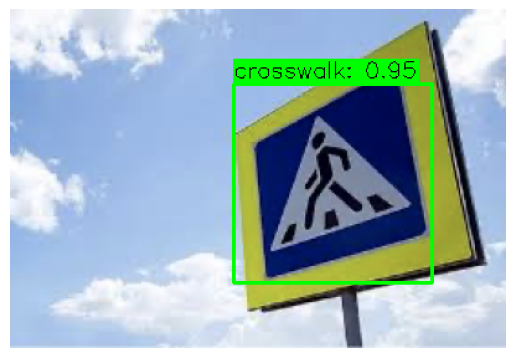

Time: 2.2803149223327637
images/road167.png


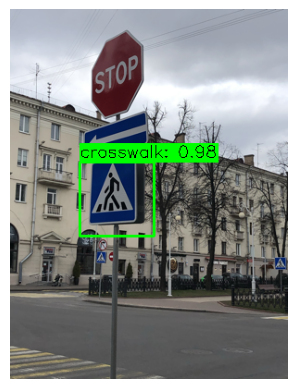

Time: 2.6335935592651367
images/road14.png


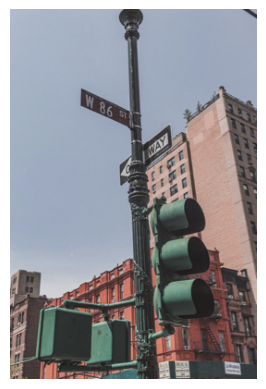

Time: 2.212003469467163
images/road160.png


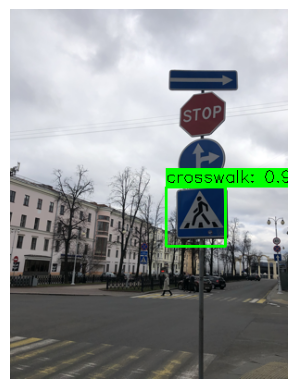

Time: 3.8752734661102295
images/road145.png


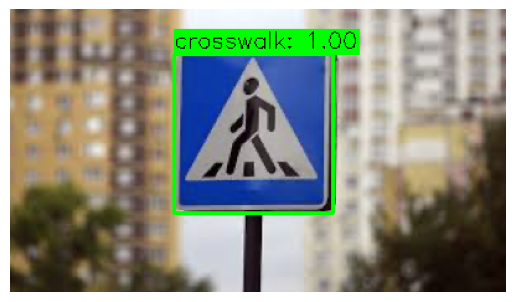

Time: 1.7666728496551514
images/road189.png


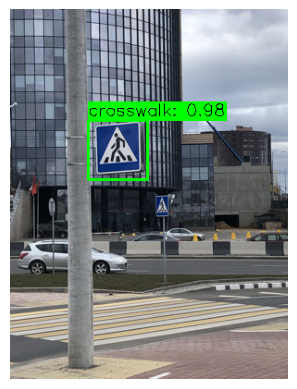

Time: 2.6488945484161377
images/road180.png


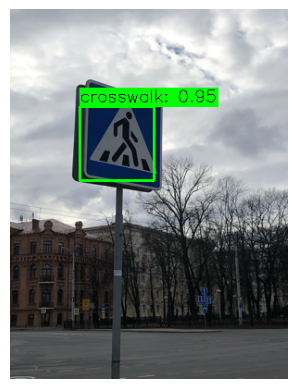

Time: 2.65902042388916
images/road16.png


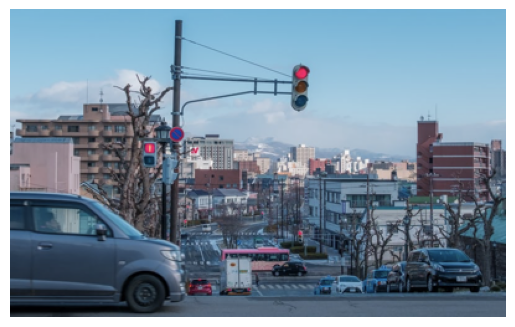

Time: 2.013288974761963
images/road183.png


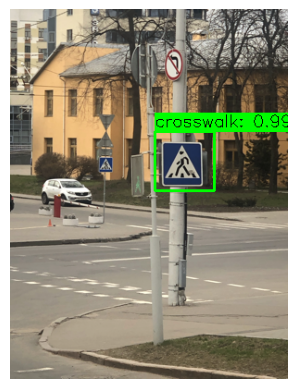

Time: 3.3902812004089355
images/road175.png


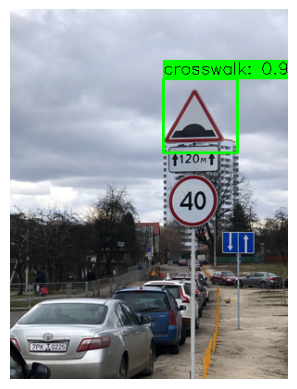

Time: 2.661625385284424
images/road140.png


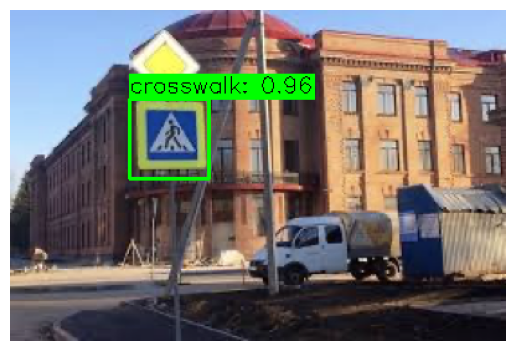

Time: 2.2619144916534424
images/road155.png


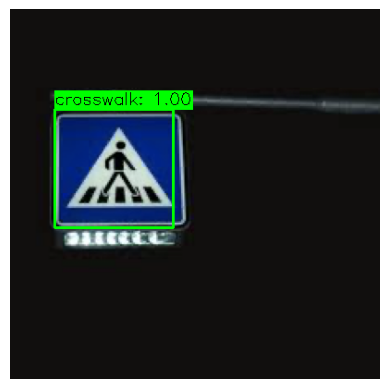

Time: 3.818601369857788
images/road174.png


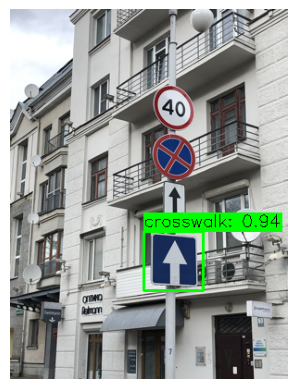

Time: 3.627709150314331
images/road137.png


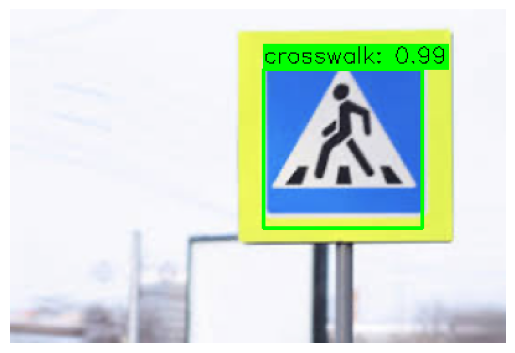

Time: 2.2132208347320557
images/road165.png


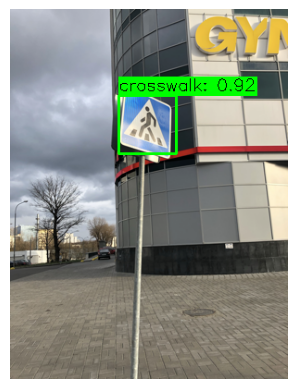

Time: 2.658076047897339


In [26]:
import time

img_fir = 'images'
img_filename_lst = os.listdir(img_fir)[50:100]
conf_threshold = 0.9
iou_threshold = 0.1
stride = 12
window_sizes = [
    (32,32),
    (64,64),
    (128,128),
    (256,256)
]

for img_filename in img_filename_lst:
    start_time  = time.time()
    img_filepath = os.path.join(img_dir, img_filename)
    print(img_filepath)
    bboxes = []
    img = cv2.imread(img_filepath)
    pyramid_imgs = pyramid(img)

    for pyramid_img_info in pyramid_imgs:
        pyramid_img, scale_factor = pyramid_img_info
        window_lst = sliding_window(
            pyramid_img,
            window_sizes = window_sizes,
            stride = stride,
            scale_factor = scale_factor
        )
        for window in window_lst:
            xmin, ymin, xmax, ymax = window
            object_img = pyramid_img[ymin:ymax, xmin:xmax]
            preprocessed_img = preprocess_img(object_img)
            normalized_img = scaler.transform([preprocessed_img])[0]
            decision = clf.predict_proba([normalized_img])[0]
            if (np.all(decision < conf_threshold)):
                continue
            else:
                predict_id = np.argmax(decision)

                conf_score = decision[predict_id]
                xmin = int(xmin / scale_factor)
                xmax = int(xmax / scale_factor)
                ymin = int(ymin / scale_factor)
                ymax = int(ymax / scale_factor)
                bboxes.append([xmin, ymin, xmax, ymax, predict_id, conf_score])
    bboxes = nms(bboxes, iou_threshold)
    visualize_bbox(img, bboxes, label_encoder)

    print(f'Time: {time.time() - start_time}')